# Giladi A. et al. haematopoiesis

## Reference:    
[Giladi A. et al. Single-cell characterization of haematopoietic progenitors and their trajectories in homeostasis and perturbed haematopoiesis. Nature Cell Biologyvolume 20, pages836–846 (2018) ](https://www.nature.com/articles/s41556-018-0121-4)

## GEO:    
https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE92575

In [1]:
%pylab inline

import warnings
warnings.filterwarnings("ignore")

from SCCAF import *
from tqdm import tqdm

Populating the interactive namespace from numpy and matplotlib


In [2]:
import os
os.system("wget -O data.tar \
'https://www.ncbi.nlm.nih.gov/geo/download/?acc=GSE92575&format=file'")
os.system("tar -xvf data.tar")

0

In [3]:
from glob import iglob
ctss=[]
names =[]
for f in tqdm(iglob("GSM*_AB*txt.gz")):
    name = f.split('_')[1].replace('.txt.gz','')
    cts= pd.read_csv(f, sep='\t',compression='gzip',index_col=0)
    cts.columns = ['%s_%s'%(name,x) for x in cts.columns]
    names=names+cts.columns.tolist()
    ctss.append(scipy.sparse.csr_matrix(cts.values))
inds = cts.index

326it [03:46,  1.21it/s]


In [4]:
cts = scipy.sparse.hstack(ctss)

In [11]:
ad = sc.AnnData(cts.T.tocsr())
ad.obs_names = names
ad.var['full_name'] = inds
ad.var_names = ad.var['full_name'].str.split(';').str[-1]
ad.var['gene_name'] = ad.var['full_name'].str.split(';').str[0]

get metadata

In [12]:
obs = pd.read_csv("ftp://ftp.ncbi.nlm.nih.gov/geo/series/GSE92nnn/GSE92575/suppl/GSE92575_metadata.txt.gz",\
                  sep='\t', skiprows=14)
obs.index = obs['Amp_batch_ID']+'_'+obs['well']

In [13]:
obs.head(3)

,well,Amp_batch_ID,Seq_batch_ID,tier,treatment,virus.mix,cytokines,well_coordinates,Subject_ID,plate_ID,...,Flt3,IL7Ra,Itgb7,Lgals3,Lineage,Ly6C,MHCII,Sca1,SiglecH,cKit
AB531_W101585,W101585,AB531,SB39,3,-,-,NaN,A1,55,258,...,255.429993,NaN,NaN,NaN,465.80002,NaN,NaN,585.650024,NaN,1828.059937
AB531_W101586,W101586,AB531,SB39,3,-,-,NaN,A3,55,258,...,200.250000,NaN,NaN,NaN,72.25000,NaN,NaN,275.399994,NaN,3430.060059
AB531_W101587,W101587,AB531,SB39,3,-,-,NaN,A5,55,258,...,221.610001,NaN,NaN,NaN,390.15002,NaN,NaN,111.350006,NaN,2120.869873


In [14]:
ad.obs = obs.loc[ad.obs_names]

In [15]:
ad.shape

(81408, 27389)

In [3]:
ad.raw = sc.pp.log1p(ad, copy=True)

In [4]:
ad.write("../write/Giladi18.h5")

In [21]:
rm GSM*_AB*txt.gz data.tar

In [2]:
ad = sc.read("../write/Giladi18.h5")

# Clean up

In [31]:
ad = sc.read("../write/Giladi18.h5")
ad = ad[ad.obs['treatment'].isin(['-']),:]
ad = ad[:,~ad.var_names.str.startswith('ERCC')]

In [32]:
sc.pp.filter_genes(ad, min_cells=5)  # only consider genes with more than 1 count
# sc.pp.normalize_per_cell(                # normalize with total UMI count per cell
#      ad, key_n_counts='n_counts_all')
sc.pp.normalize_per_cell(ad, counts_per_cell_after=1e4)          # renormalize after filtering
sc.pp.log1p(ad)
sc.pp.scale(ad)                       # scale to unit variance and shift to zero mean
sc.tl.pca(ad, n_comps=100,svd_solver='arpack')

Trying to set attribute `.var` of view, making a copy.


In [33]:
sc.pp.neighbors(ad, n_neighbors=5)
sc.tl.tsne(ad)
sc.tl.louvain(ad)

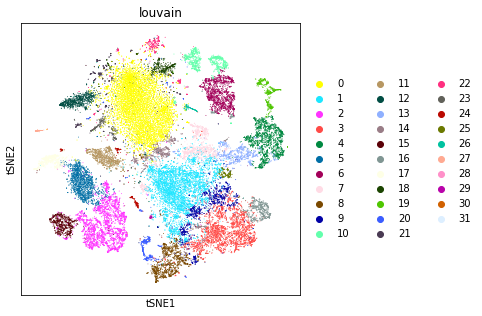

In [34]:
figsize(5,5)
sc.pl.tsne(ad, color='louvain')

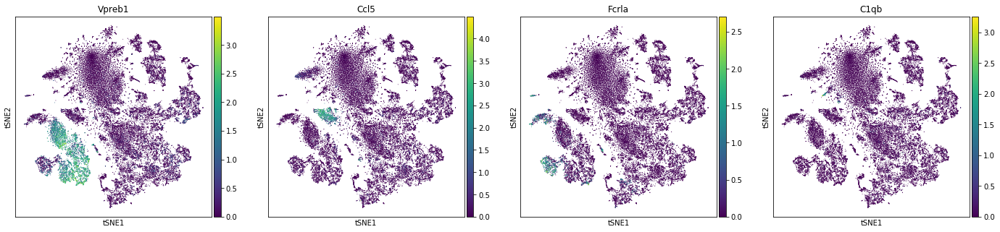

In [35]:
sc.pl.tsne(ad, color=['Vpreb1','Ccl5','Fcrla','C1qb'])

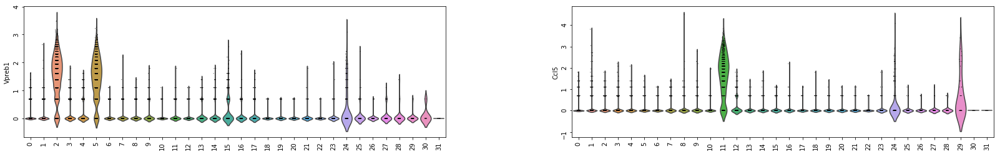

In [36]:
figsize(10,4)
sc.pl.violin(ad, groupby='louvain', keys=['Vpreb1','Ccl5'], rotation=90)

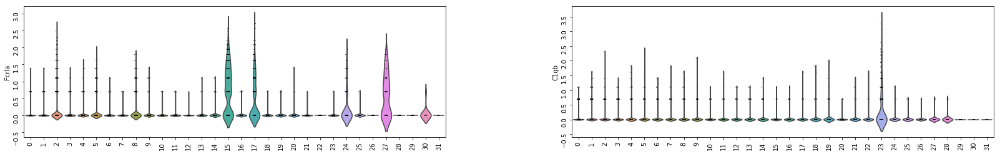

In [37]:
figsize(10,4)
sc.pl.violin(ad, groupby='louvain', keys=['Fcrla','C1qb'], rotation=90)

In [38]:
ad.write("tmp.h5")
ad = sc.read("tmp.h5")

In [39]:
ad = ad[~ad.obs['louvain'].isin(['2','5','11','24','29','15','17','24','27','23']),:]

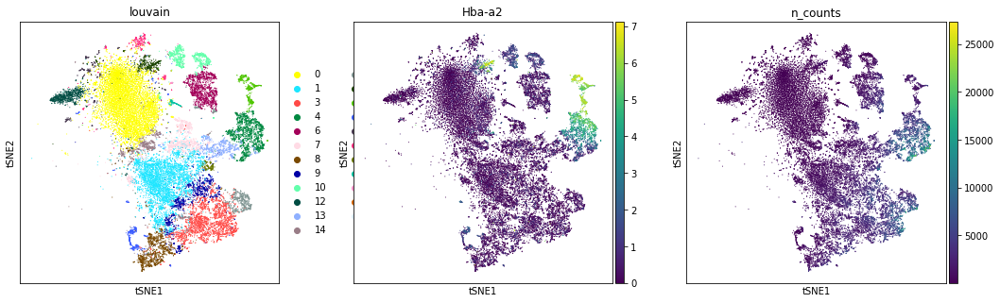

In [40]:
figsize(5,5)
sc.pl.tsne(ad, color=['louvain','Hba-a2','n_counts'])

In [41]:
# ad.write("../write/Giladi18_WT_clean.h5")

In [42]:
sc.pp.neighbors(ad, n_neighbors=7, n_pcs=50)

In [43]:
sc.tl.umap(ad)

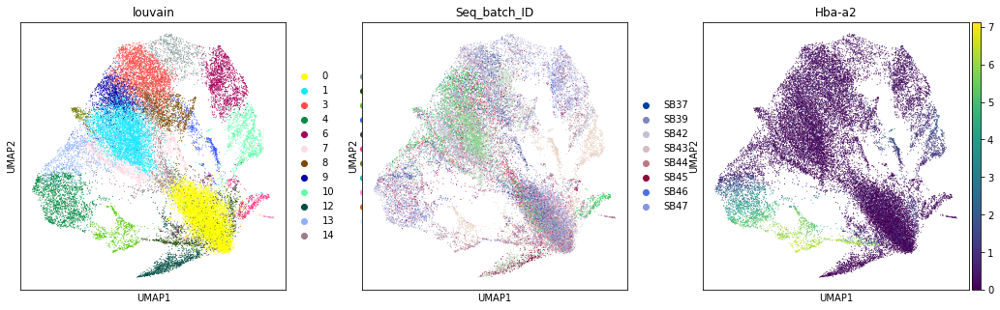

In [44]:
sc.pl.umap(ad, color=['louvain','Seq_batch_ID','Hba-a2'])

In [45]:
ad.write("tmp.h5")

# COMBAT

In [166]:
from combat import *

In [195]:
ad.shape

(28866, 15037)

In [195]:
ad.shape

(28866, 15037)

In [196]:
df = pd.DataFrame(data=ad.X.T, index=ad.var_names, columns=ad.obs_names)

import time
t = time.time()
ebat = combat(df, ad.obs['Seq_batch_ID'], None, None)
sys.stdout.write("%.2f seconds\n" % (time.time() - t))

ad.X = ebat.T

found 16 batches
found 0 numerical covariates...
found 0 categorical variables:	
Standardizing Data across genes.
Fitting L/S model and finding priors
16it [00:04,  3.79it/s]
Finding parametric adjustments
16it [02:37, 12.10s/it]
0it [00:00, ?it/s]

Adjusting data


16it [00:44,  2.75s/it]


280.79 seconds


In [197]:
%%time
sc.tl.pca(ad,svd_solver='arpack')

CPU times: user 6min 53s, sys: 38.9 s, total: 7min 31s
Wall time: 1min 55s


In [198]:
sc.pp.neighbors(ad)
sc.tl.umap(ad)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished (0:00:15.68) --> added to `.uns['neighbors']`
    'distances', weighted adjacency matrix
    'connectivities', weighted adjacency matrix
computing UMAP
    finished (0:00:27.13) --> added
    'X_umap', UMAP coordinates (adata.obsm)


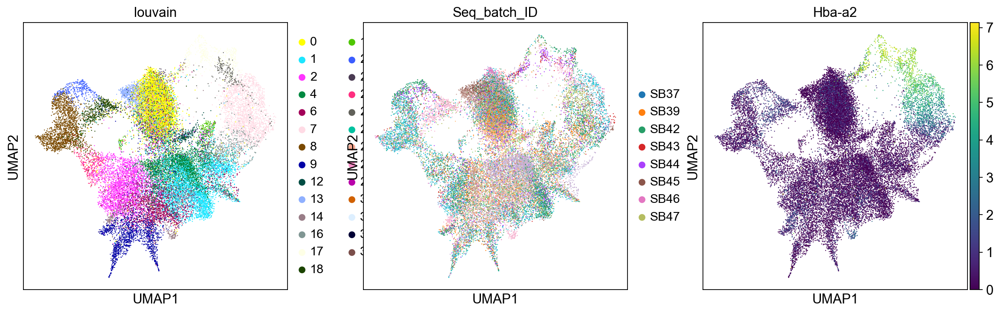

In [199]:
sc.pl.umap(ad, color=['louvain','Seq_batch_ID','Hba-a2'])

In [200]:
ad.write("../write/Giladi18_WT_clean_COMBAT.h5")

In [4]:
ls ../HEMATO/Amir18_WT_clean*

../HEMATO/Amir18_WT_clean.h5          ../HEMATO/Amir18_WT_clean_COMBAT2.h5
../HEMATO/Amir18_WT_clean_COMBAT.h5   ../HEMATO/Amir18_WT_clean_COMBAT3.h5


In [10]:
ad = sc.read("../write/Giladi18_WT_clean_COMBAT.h5")

In [14]:
sc.pp.filter_cells(ad, min_genes=10)

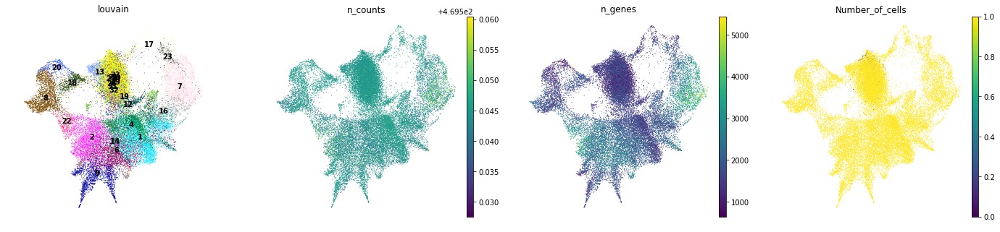

In [15]:
figsize(5,5)
sc.pl.umap(ad, color=['louvain','n_counts','n_genes','Number_of_cells'], legend_loc='on data', frameon=False)

In [234]:
sc.tl.louvain(ad)

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished (0:00:07.14) --> found 15 clusters and added
    'louvain', the cluster labels (adata.obs, categorical)


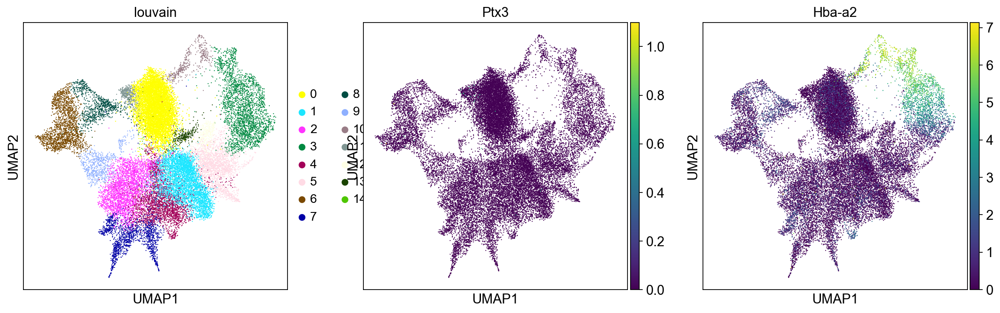

In [235]:
sc.pl.umap(ad, color=['louvain','Ptx3','Hba-a2'])

In [236]:
sc.pp.filter_cells(ad, min_genes=3)

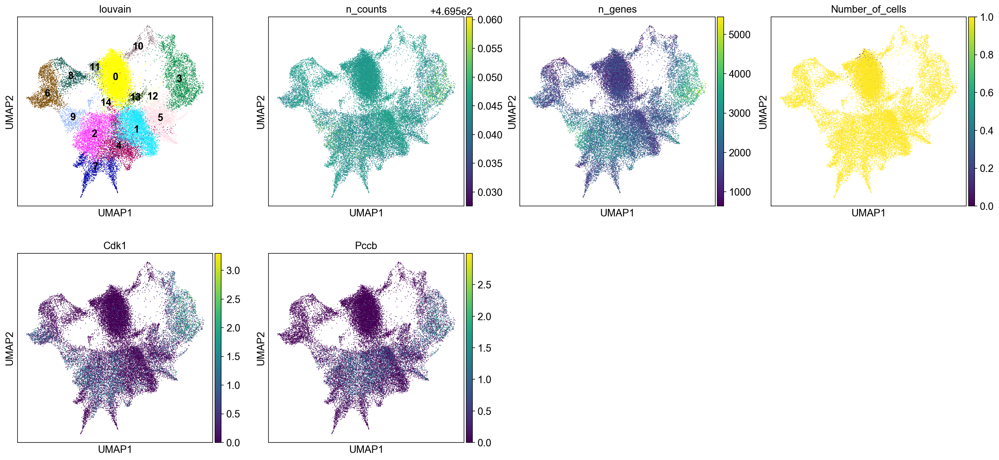

In [244]:
sc.pl.umap(ad, color=['louvain','n_counts','n_genes','Number_of_cells',\
                      'Cdk1','Pccb'], legend_loc='on data')

remove the low sequencing depth clusters: 0, 11, 13, 14

In [245]:
ad = ad[~ad.obs['louvain'].isin(['0','11','13','14']),:]

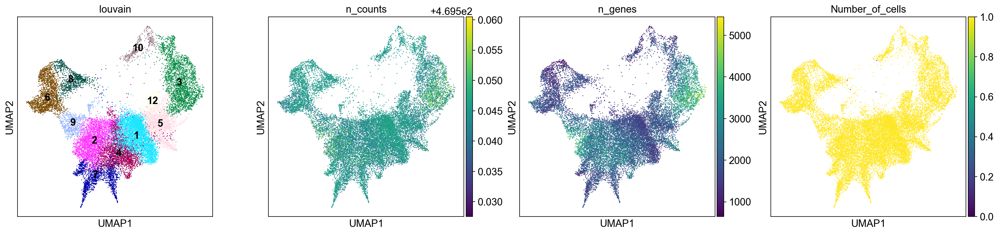

In [246]:
sc.pl.umap(ad, color=['louvain','n_counts','n_genes','Number_of_cells'], legend_loc='on data')

In [ ]:
%%time
sc.tl.pca(ad,svd_solver='arpack')

In [ ]:
sc.pp.neighbors(ad)
sc.tl.umap(ad)

In [17]:
ad = sc.read("../write/Giladi18_WT_clean_COMBAT3.h5")

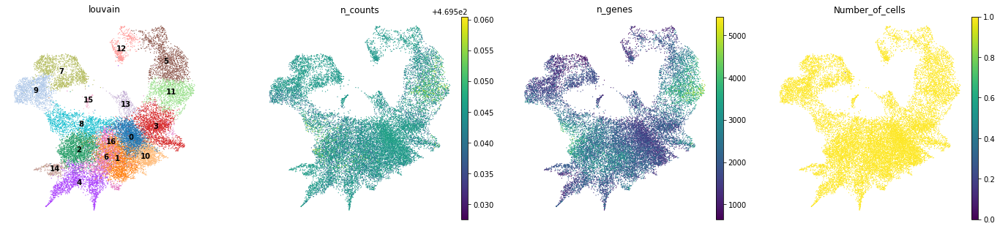

In [18]:
figsize(5,5)
sc.pl.umap(ad, color=['louvain','n_counts','n_genes','Number_of_cells'], legend_loc='on data', frameon=False)

# End